## I. Introduction

Name    : Theo Nugraha

Batch   : RMT-021

Deployment Link : [HUGGING FACE - Vehicle Type Recognition](https://huggingface.co/spaces/nugrahatheo/Vehicle-Type-Recognition)

### I.I. Project Background

In daily life, road traffic is filled with different types of vehicles such as cars, trucks, buses, and motorcycles. However, identifying and distinguishing these vehicle types from images can be a complicated task, especially in scenarios such as traffic monitoring or vehicle density analysis. With the advancement of machine learning technology, we have the opportunity to develop solutions that can aid automation in vehicle type recognition.

### I.II. About Dataset

Dataset name : `Vehicle-dataset`

Dataset source : [Kaggle - Vehicle Type Recognition](https://www.kaggle.com/datasets/kaggleashwin/vehicle-type-recognition)

This is a vehicle image classification dataset containing images of four different types of vehicles: Car, Truck, Bus, and Motorcycle. The dataset is curated to help learners to develop and evaluate image classification models for identifying various vehicle types from images.

### I.III. Objective

The main objective of this project is to build a machine learning model that can distinguish between four categories of vehicles: cars, trucks, buses, and motorcycles using Convolutional Neural Networks (CNN) and ElasticNet.

## II. Import Library

In [40]:
#Import Library

import pandas as pd
import os
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
import itertools
import cv2
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import layers, regularizers
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input, BatchNormalization
from tensorflow.keras.optimizers import Adamax

from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3 
from tensorflow.keras.applications import EfficientNetB4, EfficientNetB5, EfficientNetB6, EfficientNetB7

from sklearn.metrics import confusion_matrix

import time
import warnings
warnings.filterwarnings('ignore')

## III. Data Loading

First of all, I will load the dataset from my local directory.

In [3]:
# Data loading
main_path = '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle'
os.listdir(main_path)

['.DS_Store', 'Test', 'Train']

In [4]:
# Make directory
train_dir = os.path.join(main_path, 'Train')
test_dir  = os.path.join(main_path, 'Test')
print(train_dir)
print(test_dir)

/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Train
/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Test


## IV. Exploratory Data Analysis (EDA)

### IV.I. Class Distribusion

In this section, let's check the class distribution of each dataset. We have 2 datasets that we will use to build this model, namely: Train-Set and Test-Set. Let's find out whether the data in each class from each dataset is balanced or not.

In [5]:
# Checking count of data
def check_dir(dir=None, labels=None):
    for label in labels:
        num_data= len(os.listdir(os.path.join(dir, label)))
        print(f'Count {label}: {num_data}')

print('Train-Set:')
print('='*40)
check_dir(train_dir, ['Bus','Truck','motorcycle','Car'])
print('')

print('Test-Set:')
print('='*40)
check_dir(test_dir, ['Bus','Truck','motorcycle','Car'])

Train-Set:
Count Bus: 90
Count Truck: 90
Count motorcycle: 90
Count Car: 90

Test-Set:
Count Bus: 10
Count Truck: 10
Count motorcycle: 10
Count Car: 10


In the Train-Set, the amount of data in the `Bus`, `Truck`, `motorcycle` and `Car` classes is 90 images each. While in the Test-Set, the amount of data in the `Bus`, `Truck`, `motorcycle` and `Car` classes is 10 images each. From this result, we can conclude that the data distribution of each class from each dataset is balanced.

### IV.II. File Shape

In [6]:
# Image shape checking
img = plt.imread('/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Train/Car/Image_1.jpg')
print(img.shape)
print(f'Height  : {img.shape[0]}')
print(f'Weight  : {img.shape[1]}')
print(f'Channels: {img.shape[2]}')

(800, 1200, 3)
Height  : 800
Weight  : 1200
Channels: 3


Shape files in this dataset can be interpreted as follows:
- 800 represents the height of the image, measured in pixels.
- 1200 represents the width of the image, measured in pixels.
- 3 represents the number of color channels in the image. The number 3 indicates that this image is a color image, and has three color channels representing Red, Green, and Blue, which is usually called RGB color mode.

Next, let's see what kind of images we will process in the machine learning that we will build. We will try to analyze the characteristics of each class.

### IV.III. Class Characteristics

In [7]:
# Matches files with a specific pattern in a directory
train_Bus           = glob.glob(train_dir + '/Bus/*.jpeg') + glob.glob(train_dir + '/Bus/*.jpg') + glob.glob(train_dir + '/Bus/*.png')
train_Truck         = glob.glob(train_dir + '/Truck/*.jpeg') + glob.glob(train_dir + '/Truck/*.jpg')
train_Motorcycle    = glob.glob(train_dir + '/motorcycle/*.jpeg') + glob.glob(train_dir + '/motorcycle/*.jpg')
train_Car           = glob.glob(train_dir + '/Car/*.jpeg') + glob.glob(train_dir + '/Car/*.jpg')

test_Bus            = glob.glob(test_dir + '/Bus/*.jpeg') + glob.glob(test_dir + '/Bus/*.jpg')
test_Truck          = glob.glob(test_dir + '/Truck/*.jpeg') + glob.glob(test_dir + '/Truck/*.jpg')
test_Motorcycle     = glob.glob(test_dir + '/motorcycle/*.jpeg') + glob.glob(test_dir + '/motorcycle/*.jpg')
test_Car            = glob.glob(test_dir + '/Car/*.jpeg') + glob.glob(test_dir + '/Car/*.jpg')

train_Bus[:5]

['/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Train/Bus/Image_15.jpg',
 '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Train/Bus/Image_29.jpg',
 '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Train/Bus/Image_14.jpg',
 '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Train/Bus/Image_16.jpg',
 '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/vehicle/Train/Bus/Image_17.jpg']

In [8]:
# Function for show image
def viz_img(list_img, labels= None):
    fig,axes= plt.subplots(4,5, figsize=(15,12))
    for i, img_path in enumerate(list_img):
        image= plt.imread(img_path)
        #image= np.mean(image, axis=2)
        axes[i].imshow(image)
        axes[i].set_title(f'{labels}, {image.shape}')
    plt.show()

In [9]:
def viz_img(list_img, labels=None):
    fig, axes = plt.subplots(5, 5, figsize=(15, 12))
    axes = axes.ravel()  # Convert the subplot matrix into a 1D array
    
    for i, img_path in enumerate(list_img):
        image = plt.imread(img_path)
        #image = np.mean(image, axis=2)
        axes[i].imshow(image)
        axes[i].set_title(f'{labels}, {image.shape}')
        axes[i].axis('off')  # Off-axis
        
    # Delete the remaining unused subplots
    for j in range(len(list_img), len(axes)):
        axes[j].axis('off')
    
    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Adjustment of distance between subplots
    plt.show();

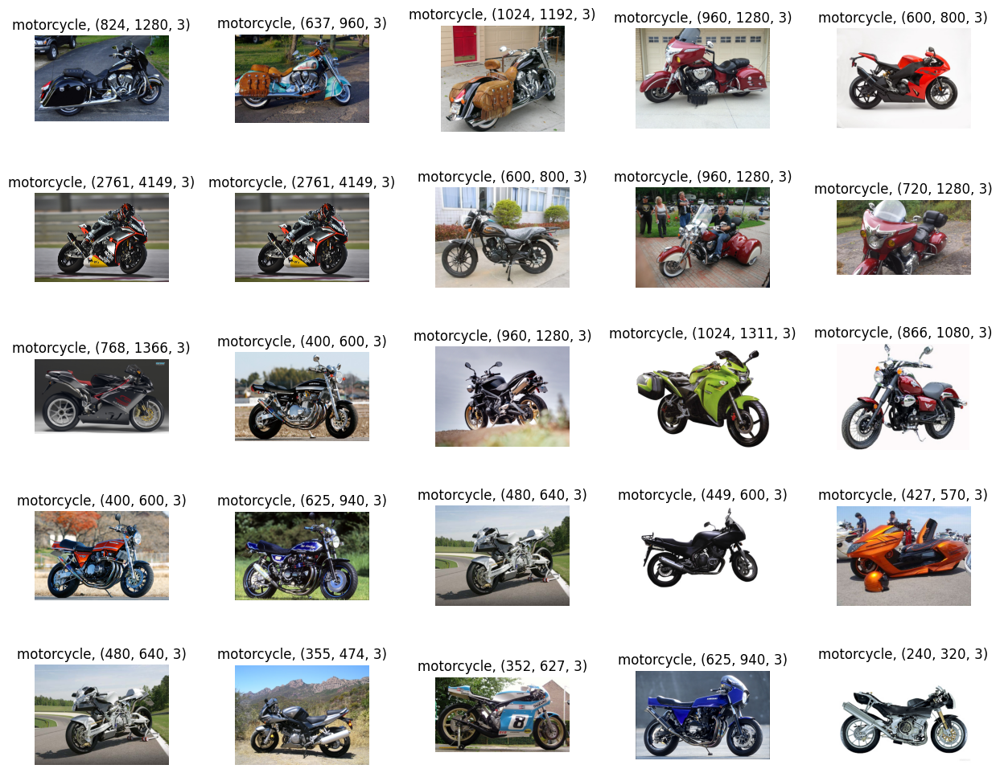

In [10]:
# Show 25 motorcycle images
viz_img(train_Motorcycle[:25], 'motorcycle')

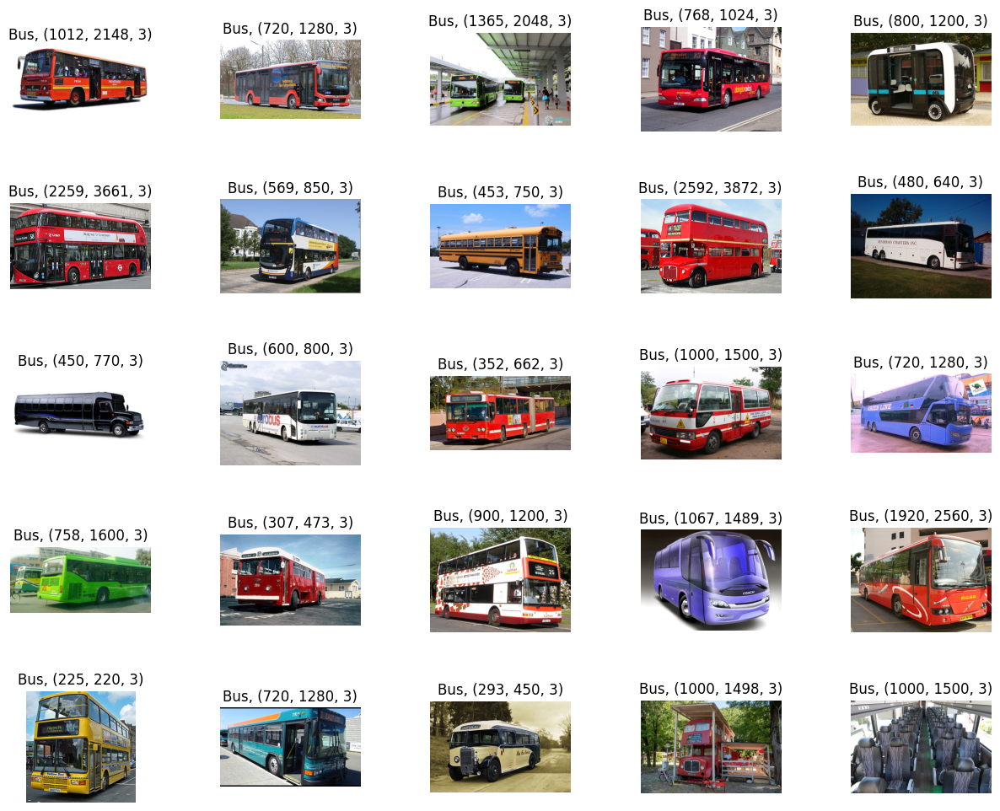

In [11]:
# Show 25 bus images
viz_img(train_Bus[:25], 'Bus')

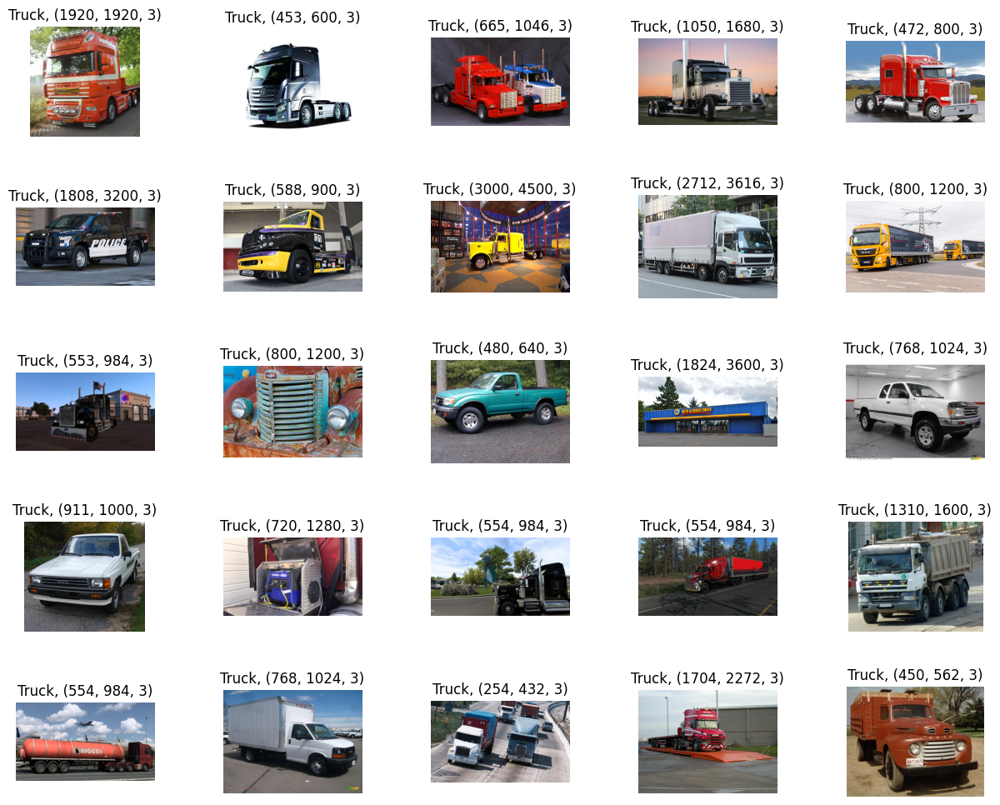

In [12]:
# Show 25 truck images
viz_img(train_Truck[:25], 'Truck')

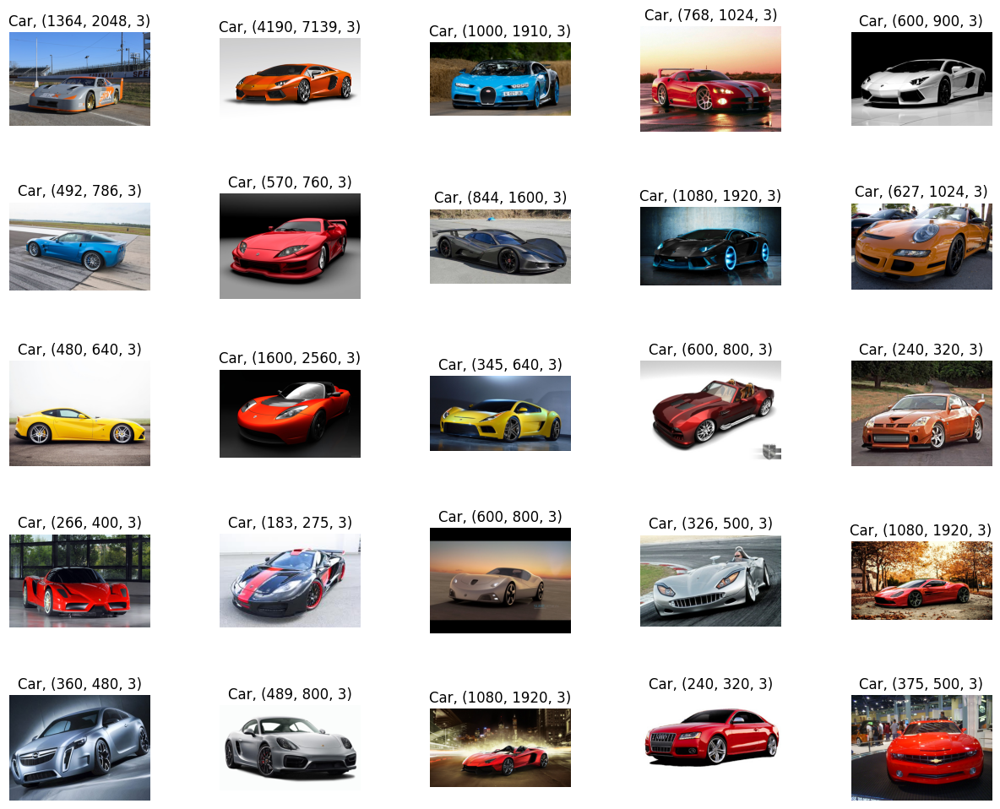

In [13]:
# Show 25 car images
viz_img(train_Car[:25], 'Car')

In theory, the differences between vehicles such as motorcycles, cars, buses and trucks lie in their physical characteristics, usage, capacity and functions. Here is an overview of their differences:

**Motorcycle**:

- A motorized vehicle with two wheels.
- It usually has a small to medium-sized engine propelled by fuel.
- Suitable for one or two passengers.
- Used mainly for short to medium distance travel, and often used in heavy traffic.
- Source: [Wikipedia - Motorcycle](https://en.wikipedia.org/wiki/Motorcycle)

**Car**:

- A motorized vehicle with four wheels.
- Has varying passenger capacities, ranging from two to eight or more.
- Can be used for individual or family travel.
- Different types of cars include sedans, SUVs, hatchbacks, coupes, and others.
- Source: [Wikipedia - Car](https://en.wikipedia.org/wiki/Car)

**Bus**:

- A large vehicle designed to carry many passengers.
- It can be a city bus, intercity bus, or tour bus.
- It usually has many seats and standing room for standing passengers.
- Used for mass transportation within cities, intercity, and tourism.
- Source: [Wikipedia - Bus](https://en.wikipedia.org/wiki/Bus)

**Truck**:

- A heavy motor vehicle used to transport goods.
- Has various types, including light trucks, heavy trucks, tow trucks, and others.
- Can be used for cargo transportation, construction, or heavy goods moving.
- Some trucks can pull additional trailers.
- Source: [Wikipedia - Truck](https://en.wikipedia.org/wiki/Truck)

Based on the information above, we can know the characteristics of each vehicle physically, usage, capacity and function. Let's do further analysis on our dataset and compare it with the theory above.

- In terms of color, between `motorcycle`, `car`, `bus` and `truck` there is no difference because we can see between the four vehicles above the color varies greatly, so we cannot make adjustments based on the color of the vehicle because there is no specific color to distinguish these types of vehicles.

- In terms of shape, between `motorcycle`, `car`, `bus` and `truck` there is a very significant difference between these vehicles. However, the model may find it difficult to distinguish between `bus` and `truck` due to the similar dimensions of the vehicles at first glance. In addition, based on the theory above, `car` has various types but in this dataset there are only sedan cars. It is likely that the accuracy level will be less good to detect `car` with vehicle types other than sedan.

- In terms of shooting angles, among `motorcycle`, `car`, `bus` and `truck` most of the shooting angles are only from the right, left and front sides. Although there may be some angles shot from above and inside the vehicle but the number is very small. This is also likely to reduce the accuracy of the model for class prediction.

- In terms of image background, among `motorcycle`, `car`, `bus` and `truck` almost all have image backgrounds that might reduce the accuracy of the model to detect the class. However, in `car` there are more images with plain background. This can also make it easier for the model to detect the class.

## V. Feature Engineering

Based on the EDA above, I will perform some image augmentation, such as: `rescale`, `horizontal_flip`, `rotation_range`, `zoom_range` and `fill_mode`. Why do I do image augmentation? Because in this case, the number of images is limited and I need to manipulate the image data to make the data more varied.

In [14]:
# Make variabel contains number
img_h       = 224
img_w       = 224
batch_size  = 16

# The seed function is used to generate the same random number on multiple code executions
tf.random.set_seed(50)

# This function which will be used in image data generator for data augmentation, it just take the image and return it again.
def scalar(img):
    return img

# Preprocess data augmentation
train_ds    = ImageDataGenerator(preprocessing_function= scalar,
                                rotation_range=40,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                brightness_range=[0.4,0.6],
                                zoom_range=0.3,
                                horizontal_flip=True,
                                vertical_flip=True,
                                validation_split=0.2)

val_ds      = ImageDataGenerator(preprocessing_function= scalar,
                                rotation_range=40,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                brightness_range=[0.4,0.6],
                                zoom_range=0.3,
                                horizontal_flip=True,
                                vertical_flip=True,
                                validation_split=0.8)

test_ds     = ImageDataGenerator(preprocessing_function= scalar,
                                rotation_range=40,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                brightness_range=[0.4,0.6],
                                zoom_range=0.3,
                                horizontal_flip=True,
                                vertical_flip=True)

- `preprocessing_function=scalar`: This argument is the pre-processing function applied to each image in the dataset. In this case, scalar is a function to rescale the intensity of the image pixels into a specific range. This is done to rescale the pixel values into a range of [0, 1] or [-1, 1] to make it more manageable for the neural model.

- `rotation_range=40`: This argument allows rotation of the image by a maximum of 40 degrees. This helps the model to learn variations in the orientation of objects in the image.

- `width_shift_range=0.2` and `height_shift_range=0.2`: These arguments allow shifting the image horizontally (left and right) and vertically (up and down) up to 20% of the image width or height. This helps the model to cope with variations in the position of objects in the image.

- `brightness_range=[0.4,0.6]`: This argument allows changing the brightness of the image in a range between 0.4 to 0.6. This provides a variation in light intensity that helps the model to cope with lighting changes in the image.

- `zoom_range=0.3`: This argument allows the model to zoom in or out of the image by up to 30%. This helps the model to learn variations in the scale of objects in the image.

- `horizontal_flip=True` and `vertical_flip=True`: These arguments allow horizontal flip and vertical flip of the image. This allows the model to learn object orientation variations and provide balanced classes in the image.

- `validation_split=0.2`: This argument allows you to split the training dataset into training and validation subsets. In this case, 20% of the training data will be used as validation data to measure the performance of the model during training.

Reasons for using this type of augmentation:

The image augmentation described above is used to introduce variations in the training dataset. With these variations, the neural model can learn to be more general and can cope with variations in the test data that may have different orientations, shifts, lighting, and scale changes. This helps the model to become more robust and general in object recognition.

All these types of augmentation collectively help prevent overfitting of the training dataset and help the model to better generalize to data that has never been seen before. By combining different types of augmentation, you can improve the model's ability to recognize objects in different situations and variations.

In [15]:
# Use object datagen (pipeline)
training_data = train_ds.flow_from_directory(train_dir,
                                            batch_size=batch_size,
                                            target_size=(img_h, img_w),
                                            subset='training',
                                            class_mode='categorical',
                                            seed=50)

validation_data = val_ds.flow_from_directory(train_dir,
                                            batch_size=batch_size,
                                            target_size=(img_h, img_w),
                                            subset='validation',
                                            class_mode='categorical',
                                            seed=50,
                                            shuffle=False) 

testing_data = test_ds.flow_from_directory(test_dir,
                                            batch_size=batch_size,
                                            target_size=(img_h, img_w),
                                            class_mode='categorical',
                                            seed=25)

Found 288 images belonging to 4 classes.
Found 288 images belonging to 4 classes.
Found 40 images belonging to 4 classes.


In [16]:
# Plot Augmented Function
def plot_augmented_images(generator, num_images=5, figsize=(15, 15)):
    plt.figure(figsize=figsize)
    
    for images, _ in generator:
        for i in range(num_images):
            augmented_img = images[i]
            plt.subplot(1, num_images, i + 1)
            plt.imshow(augmented_img)
            plt.axis('off')
        
        break
        
    plt.show();

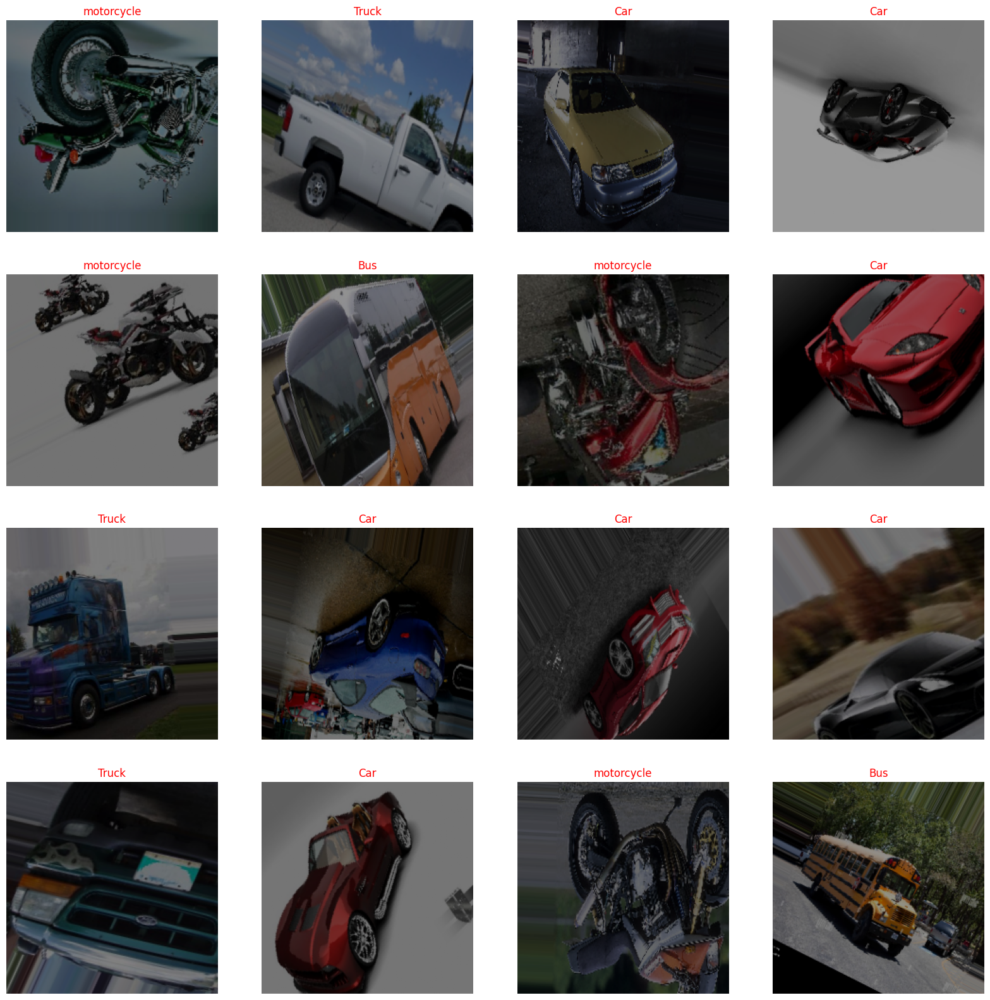

In [17]:
# Plotting augmentation image
tr_dict = training_data.class_indices      # defines dictionary {'class': index}
classes = list(tr_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(training_data)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'red', fontsize= 12)
    plt.axis('off')
    
plt.show()

After dividing the dataset into 3, namely `training_data`, `validation_data` and `testing_data`, we will do class checking on each dataset.

In [18]:
# Index class label checking from all dataset
print(training_data.class_indices)
print(validation_data.class_indices)
print(testing_data.class_indices)

{'Bus': 0, 'Car': 1, 'Truck': 2, 'motorcycle': 3}
{'Bus': 0, 'Car': 1, 'Truck': 2, 'motorcycle': 3}
{'Bus': 0, 'Car': 1, 'Truck': 2, 'motorcycle': 3}


There are 4 classes in all datasets, namely `Bus` class, `Car` class, `Truck` class and `motorcycle` class.

## VI. Model Definition

In [23]:
# Clear Session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [24]:
inputs = (img_h, img_w, 3)
model_seq_1   = Sequential([
    layers.Rescaling(1/255, input_shape=inputs),
    layers.Conv2D(64, 3, activation='relu', kernel_initializer='HeNormal', kernel_regularizer='l2'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(padding='same'),
    layers.Dropout(0.2,seed=50),
    layers.Flatten(),
    layers.Dropout(0.5,seed=50),
    layers.Dense(128, activation= 'relu'),
    layers.Dense(4, activation= 'softmax'),
    ]
)

model_seq_1.compile(optimizer='Adam', loss= 'categorical_crossentropy', metrics=['accuracy'])

model_seq_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 55, 55, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 55, 55, 32)        0

Here, I will use the Sequential model. Let's go through it step by step:

- `layers.Rescaling(1/255, input_shape=inputs)`: The first layer of the model. It rescales the image pixel values to be in the range [0, 1]. input_shape indicates the input dimensions of the image.

- `layers.Conv2D(64, 3, activation='relu', kernel_initializer='HeNormal', kernel_regularizer='l2')`: Conv2D layer with 64 filters, 3x3 kernel size, ReLU activation function, weight initialization using He Normal method, and L2 regularization to prevent overfitting.

- `layers.MaxPooling2D()`: A pooling layer that performs a max-pooling operation on the output of the previous layer. This helps to reduce the dimensionality of the data and extract important features.

- `layers.Conv2D(32, 3, activation='relu')`: The second convolution layer with 32 filters of size 3x3 and activation function 'relu'.

- `layers.MaxPooling2D(padding='same')`: Second pooling layer with max-pooling operation, using 'same' padding to keep the output dimension.

- `layers.Dropout(0.2, seed=50)`: A dropout layer that randomly disables about 20% of the neurons in the training stage to avoid overfitting. Seed is used to control randomization.

- `layers.Flatten()`: This layer converts the input matrix into a one-dimensional vector, which is ready to be connected to the dense layer.

- `layers.Dropout(0.5, seed=50)`: The second dropout layer with a 50% dropout rate.

- `layers.Dense(128, activation='relu')`: A dense layer with 128 neurons and activation function 'relu'.

- `layers.Dense(4, activation='softmax')`: The last dense layer with 4 neurons (corresponding to the number of classes) and a softmax activation function, which generates the class probability distribution.

- `model_seq_1.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])`: The last step is to compile the model. optimizer is the optimization algorithm used during training (in this case, Adam). loss is the loss function used (categorical crossentropy for multiclass classification). metrics is the metric to be evaluated during training (in this case, accuracy).

## VII. Model Training

After we augment the image data, then we try to build a model with the parameters above, then in this section we will train the model that we have built with the image data that we have augmented before. Let's try it!

In [25]:
# Train the model
start_time = time.time()

history_seq = model_seq_1.fit(
    training_data,
    validation_data = validation_data,
    epochs          = 50,
    verbose         = 1)

print("Process finished --- %s seconds ---" % (time.time() - start_time))

Epoch 1/50
18/18 [==============================] - 68s 4s/step - loss: 3.7880 - accuracy: 0.2917 - val_loss: 2.6128 - val_accuracy: 0.2604
Epoch 2/50
18/18 [==============================] - 68s 4s/step - loss: 2.5792 - accuracy: 0.2535 - val_loss: 2.5358 - val_accuracy: 0.3681
Epoch 3/50
18/18 [==============================] - 52s 3s/step - loss: 2.5046 - accuracy: 0.3125 - val_loss: 2.4625 - val_accuracy: 0.3125
Epoch 4/50
18/18 [==============================] - 47s 3s/step - loss: 2.4378 - accuracy: 0.3125 - val_loss: 2.3944 - val_accuracy: 0.2882
Epoch 5/50
18/18 [==============================] - 47s 3s/step - loss: 2.4110 - accuracy: 0.3160 - val_loss: 2.3482 - val_accuracy: 0.3472
Epoch 6/50
18/18 [==============================] - 47s 3s/step - loss: 2.3452 - accuracy: 0.3368 - val_loss: 2.3401 - val_accuracy: 0.3472
Epoch 7/50
18/18 [==============================] - 48s 3s/step - loss: 2.2846 - accuracy: 0.3715 - val_loss: 2.3427 - val_accuracy: 0.2743
Epoch 8/50
18/18 [==

## VIII. Model Evaluation

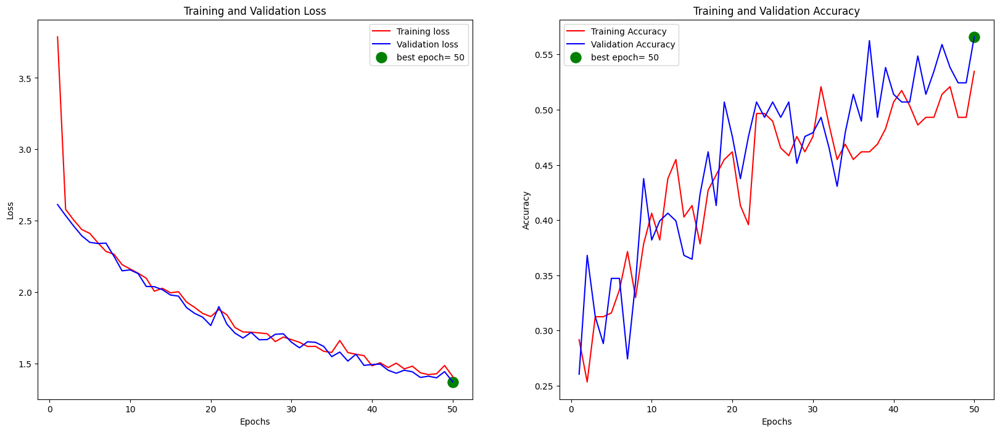

In [26]:
# Define needed variables
train_acc       = history_seq.history['accuracy']
train_loss      = history_seq.history['loss']
validation_acc  = history_seq.history['val_accuracy']
validation_loss = history_seq.history['val_loss']

index_loss = np.argmin(validation_loss)
val_lowest = validation_loss[index_loss]
index_acc = np.argmax(validation_acc)
acc_highest = validation_acc[index_acc]

Epochs = [i+1 for i in range(len(train_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history

plt.figure(figsize= (20, 8))

plt.subplot(1, 2, 1)
plt.plot(Epochs, train_loss, 'r', label= 'Training loss')
plt.plot(Epochs, validation_loss, 'b', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'green', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, train_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, validation_acc, 'b', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'green', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

Based on the results of the model training process that we have built and with the training and validation datasets from our previous augmentation, we can draw the following conclusions:

**Loss**:
- In the first epoch, the loss value was 3.7880 and then gradually decreased as time passed. Finally, at the 50th epoch, the loss has dropped to 1.4085.

**Accuracy**:
- At the first epoch, the model accuracy was 29.17% and also varied throughout the training. The accuracy increased from the beginning to the end of training and reached 56.60% at the 50th epoch.

**Validation Data**:
- There are two metrics evaluated on the validation data (val_loss and val_accuracy).
- Initially, val_loss is about 2.61 and val_accuracy is about 26.04%.
- During training, val_loss and val_accuracy also fluctuated, but finally, val_loss dropped to about 1.37 and val_accuracy rose to about 56.60%.

**Training Pattern**:
- Initially, the model seems to have difficulty in training with low accuracy and high loss. This may be a sign that the model needs hyperparameter tuning or a larger dataset size. However, over time, the model gradually learns the patterns in the data and starts making better predictions with lower loss and higher accuracy. It is important to understand that the loss and accuracy graphs often have fluctuations throughout training.

**Overfitting**:
- We cannot say for sure whether the model suffers from overfitting just from this information. To evaluate overfitting, you need to check how the model performs outside the training and validation data (for example, by using separate test data).

**Training Time**:
- The training time of each epoch is displayed, with the time ranging from about 44 to 68 seconds per epoch. If training takes a long time, consider optimizing the code or using more powerful hardware for training.

After this, let's see how the results of the model we have built using the testing dataset. Does the model produce good results or does it produce bad results?

In [42]:
# Accuracy Score
test_length = len(testing_data)
test_batch_size = max(sorted([test_length // n for n in range(1, test_length + 1) if test_length%n == 0 and test_length/n <= 80]))
test_steps = test_length // test_batch_size

train_score = model_seq_1.evaluate(training_data, steps= test_steps, verbose= 1)
valid_score = model_seq_1.evaluate(validation_data, steps= test_steps, verbose= 1)
test_score = model_seq_1.evaluate(testing_data, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

1/1 [==============================] - 1s 678ms/step - loss: 1.4438 - accuracy: 0.5625
Train Loss:  1.2824417352676392
Train Accuracy:  0.625
--------------------
Validation Loss:  1.5788822174072266
Validation Accuracy:  0.4375
--------------------
Test Loss:  1.4437776803970337
Test Accuracy:  0.5625


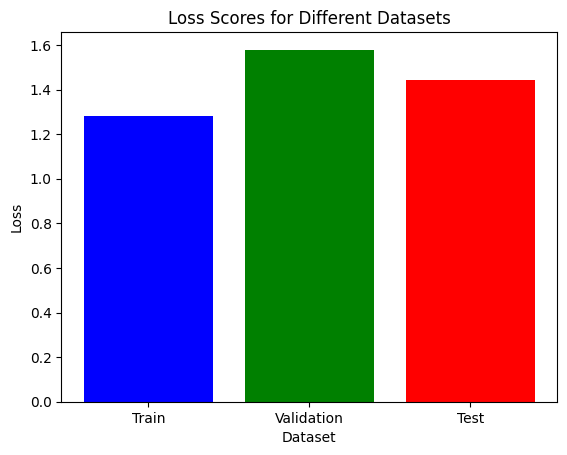

In [45]:
# Create a bar plot for lost scores
labels = ['Train', 'Validation', 'Test']
loss_scores = [train_score[0], valid_score[0], test_score[0]]

plt.bar(labels, loss_scores, color=['blue', 'green', 'red'])
plt.xlabel('Dataset')
plt.ylabel('Loss')
plt.title('Loss Scores for Different Datasets')
plt.show()

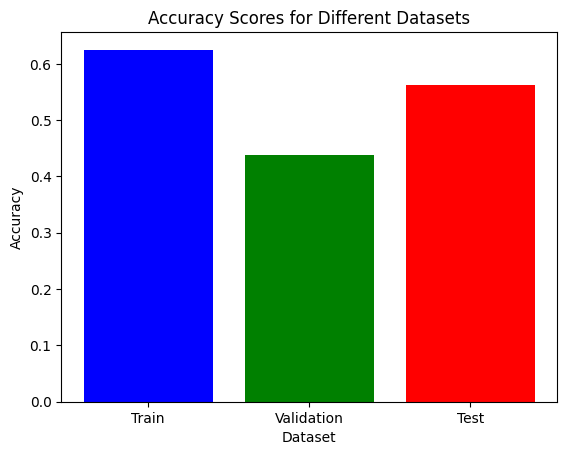

In [43]:
# Create a bar plot for accuracy scores
labels = ['Train', 'Validation', 'Test']
accuracy_scores = [train_score[1], valid_score[1], test_score[1]]

plt.bar(labels, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Dataset')
plt.ylabel('Accuracy')
plt.title('Accuracy Scores for Different Datasets')
plt.show()

Based on the Accuracy Score that we have obtained, we can analyze and draw conclusions that:

**Train Loss** and **Train Accuracy**:
- Train Loss is a measure of how well the model adapts to the training data. The lower the Train Loss value, the better the model learns the patterns in the training data.
- Train Accuracy is the percentage of the training data that is correctly classified by the model. A value of 0.5625 means that the model correctly predicted about 56.25% of the training data.
- A low Train Loss value (1.3425) and a fairly high Train Accuracy (0.5625) indicate that the model understands the training data quite well. However, this is not enough to judge whether the model will perform well on new data that has never been seen before.

**Validation Loss** and **Validation Accuracy**:
- Validation Loss is a measure of how well your model fits the validation data. This is important because it can help us determine if the model is overfitting. If Validation Loss is higher than Train Loss, this could be an indication of overfitting.
- Validation Accuracy is the percentage of validation data that is correctly classified by the model. A value of 0.4375 means that the model correctly predicted about 43.75% of the validation data.
- In this case, the Validation Loss (1.7097) is higher than the Train Loss, which could indicate overfitting. However, it is not always a problem if the difference is not too large.

**Test Loss** and **Test Accuracy**:
- Test Loss is a measure of how well the model predicts test data that has never been seen before. It is the most important measure as it represents the model's performance on new data.
- Test Accuracy is the percentage of test data that is correctly classified by the model. A value of 0.5 means that our model correctly predicts about 50% of the test data.
- The low Test Loss (1.3617) and fairly good Test Accuracy (0.5) results indicate that the model may have good performance on new data. However, for a more accurate assessment, we should also consider other factors such as the type of test data and whether these results meet our business objectives or the task at hand.

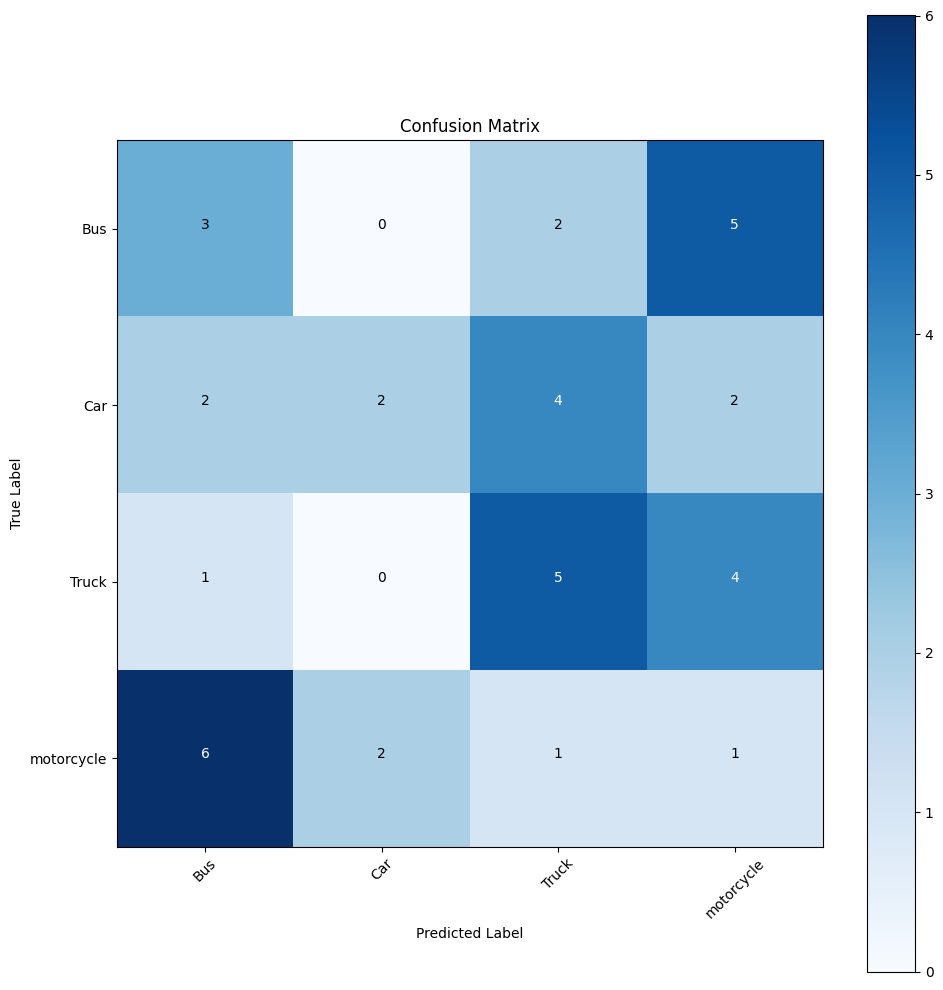

In [28]:
# Confusion matrix for Testing Dataset

test_preds = model_seq_1.predict_generator(testing_data)
y_pred_test = np.argmax(test_preds, axis=1)
test_dict = testing_data.class_indices
test_classes = list(test_dict.keys())

cm = confusion_matrix(testing_data.classes, y_pred_test)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(test_classes))
plt.xticks(tick_marks, test_classes, rotation= 45)
plt.yticks(tick_marks, test_classes)


thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

By using the confusion matrix, we can see the recognition errors made by the model we have built. In the test dataset, we know that there are 10 image files from each class. Let's discuss the results of the confusion matrix.

**Bus Class**:

- Only 3 out of 10 bus images were recognized correctly. This shows that the model has difficulty in identifying buses. This could be due to the visual similarity between buses and other vehicles in the dataset.
- 2 images were misclassified as truck and 5 images were misclassified as motorcycles. This could be due to the differences in visual features not being sharp enough between buses , truck and motorcycles.

**Car Class**:

- Only 2 out of 10 car images are correctly recognized. This indicates that the model has serious problems identifying cars.
- 2 images were misclassified as buses, 2 images were misclassified as motorcycle and 4 images as truck. This shows that the model tends to confuse cars with other types of vehicles.

**Truck Class**:

- Only 5 out of 10 truck images were recognized correctly. This shows that the model also struggled in identifying trucks.
- 1 images were misclassified as buses and 4 images as motorcycles. This shows that the model has problems distinguishing trucks from other types of vehicles.

**Motorcycle Class**:

- Only 1 out of 10 motor images were recognized correctly. This shows that the model has problems identifying motorcycles.
- 6 images were misclassified as buses, 2 images as cars, and 1 image as a truck. This shows that the model also has difficulty in distinguishing motorcycles from other types of vehicles.

**Suggestions for Improvement**:

- Model Architecture Exploration: You can try exploring different model architectures, such as changing or adding layers to your model. You can also try better preprocessing models to extract better features from images.

- Hyperparameter Tuning: You can adjust the training hyperparameters, such as the learning rate or batch size. These adjustments can help speed up model convergence and improve performance.

- Data Augmentation: Adding data variations by augmentation (e.g. rotation, cropping, or shifting) can help the model learn a wide variety of images. This can help improve the accuracy of the model.

- Regularization: Applying regularization techniques such as dropout or weight decay can help reduce overfitting if needed.

- Further Data Collection: If possible, collecting more training data can help improve model performance. The more variety of data a model has, the better it is at generalizing knowledge.

- Testing with New Data: Once you have updated your model, make sure to test the model with data that it has never seen before (test data) to get a better estimate of its performance in the real world.

- Hardware Optimization: If you have access to more powerful hardware (for example, a faster GPU), this can help speed up training.

## IX. Model Improvement

In this Model Improvement, I tried transfer learning using the **EfficientNet** model and hoped that the results would be better than the model I built before. The reasons why I used the model are as follows:

- **EfficientNet**: With its intelligent scaling approach, EfficientNet can generate models that are efficient in training and resource usage. This is important because vehicle type recognition tasks usually involve large datasets with many visual variations.

- **Image Processing Capabilities**: EfficientNet is naturally suited for computer vision tasks, including vehicle type recognition, as its architecture is specifically designed for feature extraction from image data.

- **Resolution Flexibility**: By accounting for image resolution as one of the scaling factors, EfficientNet can handle variations in image resolution in vehicle datasets that may be captured from different viewpoints and distances.

- **Model Complexity**: By scaling wisely, EfficientNet can generate a model with a complexity suitable for the vehicle type recognition task, avoiding overfitting or underfitting.

- **Performance**: EfficientNet has been proven to perform well on a variety of computer vision tasks.

The **EfficientNet** variation I used in this case is **EfficientNetB0** because in the case of vehicle type recognition with only 100 images in the dataset, there are some considerations that need to be taken into account:

- Number of Parameters: EfficientNetB0 is one of the variants of the EfficientNet family of models that have been optimized for computer vision tasks. However, B0 is a more lightweight model with fewer parameters than other variants such as B1, B2, and so on. With a very small dataset (only 100 images), using a model that is too large such as B2, B3, or higher is more likely to suffer from overfitting as the model has a larger capacity.

- Overfitting: In the case of very small datasets, the risk of overfitting (a model that over-learns the training data and cannot generalize well to new data) is very high. Larger models such as EfficientNetB2 or higher will be more likely to experience overfitting on datasets this small.

- Computational Complexity: Larger models require more computing power and time to train. With a small dataset, I may not have enough computational resources to train a larger model efficiently.

- Generalization Ability: Smaller models like EfficientNetB0 may be better at generalizing on small datasets. This is because it has a lower capacity and is less "robust" in adjusting to limited training data.

---

In theory, **EfficientNet** is as follows:

EfficientNet is one of the convolutional neural network (CNN) architectures designed to achieve high efficiency in training and good performance in computer vision tasks. This architecture was proposed by Mingxing Tan and Quoc V. Le in a paper titled "EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks" in 2019.

EfficientNet combines the concept of proper scaling with key components in the convolutional neural network architecture, such as convolutional layers, layer width, and image resolution. The scaling concept in EfficientNet is done through three main parameters: Depth (D), Width (W), and Resolution (R). Combining these three factors allows the architecture to achieve good performance with fewer parameters, making it more efficient in training and resource usage.

The main advantages and characteristics of EfficientNet are as follows:

- **Compound Scaling**: EfficientNet uses a compound scaling approach by increasing all three factors D, W, and R simultaneously. This allows the model to better extract features with fewer parameters.

- **Efficient Blocks**: The architecture uses efficient basic block structures, such as MBConv (Mobile Inverted Bottleneck Convolution), which combines the concepts of inverted residual and bottleneck blocks to reduce parameter usage.

- **Swish Activation**: Swish activation is used in the convolution block, which is found to provide better performance than ReLU on this architecture.

- **Depthwise Separable Convolution**: EfficientNet uses depthwise separable convolution to reduce the number of computational operations.

- **Global Average Pooling**: Global Average Pooling is used as an alternative to the fully connected layer at the end of the architecture. This helps reduce the number of parameters and overfitting.

- **AutoML**: EfficientNet architecture is developed through AutoML (automated machine learning) exploration, which helps to find the best combination of D, W, and R parameters.


EfficientNet features a "compound scaling" approach that takes into account three main factors: Depth (D), Width (W), and Resolution (R) to develop different variants of the model tailored to the size and complexity of the dataset. Each variant is labeled with a "B" followed by a number representing the level of model complexity. Here are the differences between the EfficientNet variants:

**EfficientNetB0**:
- The base model in the EfficientNet series.
- Uses a smaller configuration in terms of Depth (D), Width (W), and Resolution (R).
- It is usually lighter and faster to train than the larger variants.

**EfficientNetB1**:
- Uses slightly more scaling than B0, with a slightly larger increase in resolution and depth.
- More complex than B0 but still efficient in terms of resource usage.

**EfficientNetB2**:
- Continuation of B1 with more scaling.
- Has even greater resolution and depth, and increased layer width.

**EfficientNetB3**:
- A larger variant of B2 with improvements in all scaling factors.
- Suitable for more complex and large datasets.

**EfficientNetB4**:
- Larger than B3 with improvements in all scaling factors.
- Suitable for larger datasets or tasks with high complexity.

**EfficientNetB5**:
- A model with even greater scaling than B4.
- Suitable for highly complex vision tasks, including object detection or segmentation tasks.

**EfficientNetB6**:
- An even larger variant of B5.
- Offers better performance for highly demanding tasks.

**EfficientNetB7**:
- The largest and most complex variant in the EfficientNet family.
- Suitable for tasks that require highly detailed and complex image processing.


In general, the higher the number added to "B", the greater the complexity and size of the model. However, keep in mind that the larger the model, the more resources are required for training and inference. The choice of model variant should be tailored to the size of the dataset, the task to be accomplished, and the resources available. If the dataset and resources are limited, smaller variants such as B0 or B1 may be more suitable, while larger variants such as B6 or B7 are suitable for tasks that require a higher level of complexity and sufficient resources.

In [29]:
# Clear Session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

The first step I will do is create a model with the following specifications:

In [30]:
class_count = len(list(training_data.class_indices.keys())) # to define number of classes in dense layer

EN_Model = tf.keras.applications.efficientnet.EfficientNetB0(include_top= False, 
                                                            weights= "imagenet", 
                                                            input_shape= inputs, 
                                                            pooling= 'max')
EN_Model.trainable = False

model_EN = Sequential([
    EN_Model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(128, kernel_regularizer= regularizers.l2(l= 0.016), 
        activity_regularizer= regularizers.l1(0.006),
        bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 50),
    Dense(class_count, activation= 'softmax')
])

model_EN.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model_EN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
 batch_normalization (BatchN  (None, 1280)             5120      
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 128)               163968    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 4)                 516       
                                                                 
Total params: 4,219,175
Trainable params: 167,044
Non-trainable params: 4,052,131
________________________________________

`EN_Model = tf.keras.applications.efficientnet.EfficientNetB0(...)` : This is the first step in creating a model using the pretrained EfficientNetB7 architecture.

`include_top=False`: Indicates that we will not use the top fully connected layer (classifier) of the model, as we will create our own layer.

- `weights="imagenet"`: Uses weights that have been trained on the ImageNet dataset.

- `input_shape=inputs`: Specifies the input shape corresponding to the image dimensions to be used in the model.

- `pooling='max'`: Uses the global max pooling layer as the pooling method.

- `EN_Model.trainable=False`: Specifies that the layers in the EfficientNetB7 model are non-trainable. This can be useful if I want to keep the pre-trained weights and avoid overfitting on smaller datasets.

Build model model_EN on top of EfficientNetB7:

- `EN_Model`: This is the EfficientNet model that will be part of the model being built. This model has been initialized and configured before.

- `BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001)`: The Batch Normalization layer is used to speed up and maintain training stability by normalizing the values in a batch of data. The `axis` determines which axis the normalization will be performed on, `momentum` is a factor that controls the extent to which the mean and variance values are calculated. `epsilon` is a value added to the variance to prevent division by zero.

- `Dense(128, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006), bias_regularizer= regularizers.l1(0.006), activation= 'relu')`: This is a Dense (fully connected) layer with 128 neuron units. The `kernel_regularizer`, `activity_regularizer`, and `bias_regularizer` apply L2 and L1 regularization to the weights, activity, and bias respectively.
`activation='relu'` specifies that the ReLU activation function will be used after the Dense layer.

- `Dropout(rate= 0.45, seed= 50)`: This is the Dropout layer which will set the dropout rate to 0.45.
Dropout is a regularization technique that randomly "disables" a number of neuron units during training to prevent overfitting.
seed= 50 is a random seed value used to generate randomly consistent values at each training iteration.

- `Dense(class_count, activation='softmax')`: This is the last Dense layer that has as many units as class_count, in this case the number is 4. The activation function softmax is used to generate the class probabilities on the output.


The reason I used this specification is because it reflects the use of a pre-trained EfficientNetB0 model for a different classification task with additional customizations relevant for that task. This is generally a good approach in most cases as it combines the advantages of a robust feature representation of an existing model with the ability to adapt the model for this particular classification task.

After creating the model, I added `EarlyStopping` which is useful for stopping the training if overfitting occurs or if the performance of the model on the validation dataset does not improve.

In [31]:
# Early Stopping
early_stopping = EarlyStopping(monitor='val_accuracy', 
                              patience=5, 
                              restore_best_weights=True,
                              mode='max',
                              )

def step_decay(epoch):
     initial_lrate = 0.1
     drop = 0.5
     epochs_drop = 10.0
     lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
     return lrate

lr_scheduler = LearningRateScheduler(step_decay)

- `monitor='val_accuracy'` indicates that we will monitor the accuracy metric on the validation dataset (val_accuracy) to determine when to stop.
- `patience=5` indicates that training will stop if the accuracy on the validation dataset does not improve for 5 consecutive epochs. This serves to prevent training for too long if there is no improvement.
- `restore_best_weights=True` will restore the model's weights to the best point on the validation dataset, so that the model will have the best performance by the time training stops.
- `mode='max'` indicates that we want to achieve maximum accuracy on the validation dataset. If mode is 'min', then Early Stopping will stop if the monitored metric drops.

In [32]:
# Train the model
start_time = time.time()

history_EN = model_EN.fit(x             = training_data,
                    epochs              = 50,
                    verbose             = 1,
                    validation_data     = validation_data, 
                    validation_steps    = None,
                    shuffle             = False,
                    batch_size          = batch_size)

print("Process finished --- %s seconds ---" % (time.time() - start_time))

Epoch 1/50
18/18 [==============================] - 55s 3s/step - loss: 5.2916 - accuracy: 0.5590 - val_loss: 5.6345 - val_accuracy: 0.7535
Epoch 2/50
18/18 [==============================] - 46s 3s/step - loss: 4.6024 - accuracy: 0.7535 - val_loss: 4.9004 - val_accuracy: 0.8264
Epoch 3/50
18/18 [==============================] - 48s 3s/step - loss: 4.4738 - accuracy: 0.8056 - val_loss: 4.4800 - val_accuracy: 0.8993
Epoch 4/50
18/18 [==============================] - 47s 3s/step - loss: 4.3532 - accuracy: 0.7986 - val_loss: 4.2776 - val_accuracy: 0.8993
Epoch 5/50
18/18 [==============================] - 48s 3s/step - loss: 4.2010 - accuracy: 0.8576 - val_loss: 4.0339 - val_accuracy: 0.9306
Epoch 6/50
18/18 [==============================] - 45s 3s/step - loss: 4.0675 - accuracy: 0.8542 - val_loss: 3.9863 - val_accuracy: 0.9340
Epoch 7/50
18/18 [==============================] - 47s 3s/step - loss: 3.9957 - accuracy: 0.8438 - val_loss: 3.8102 - val_accuracy: 0.9410
Epoch 8/50
18/18 [==

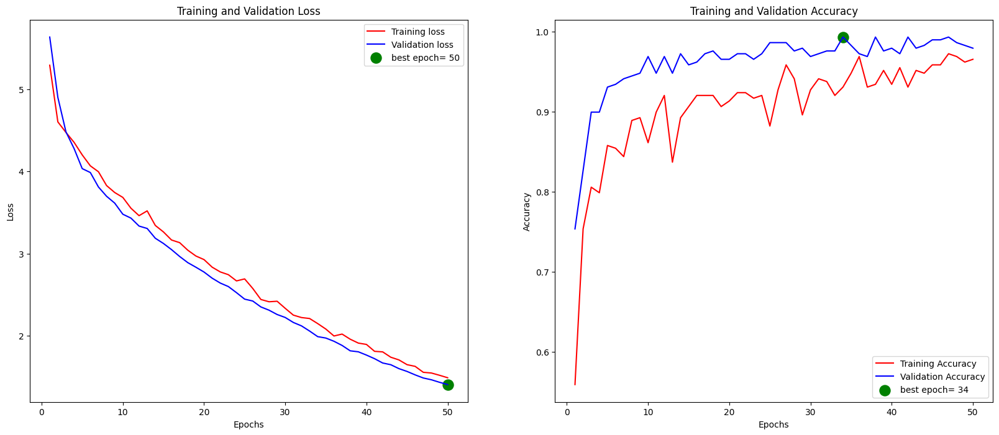

In [33]:
# Define needed variables
train_acc       = history_EN.history['accuracy']
train_loss      = history_EN.history['loss']
validation_acc  = history_EN.history['val_accuracy']
validation_loss = history_EN.history['val_loss']

index_loss = np.argmin(validation_loss)
val_lowest = validation_loss[index_loss]
index_acc = np.argmax(validation_acc)
acc_highest = validation_acc[index_acc]

Epochs = [i+1 for i in range(len(train_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history

plt.figure(figsize= (20, 8))

plt.subplot(1, 2, 1)
plt.plot(Epochs, train_loss, 'r', label= 'Training loss')
plt.plot(Epochs, validation_loss, 'b', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'green', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, train_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, validation_acc, 'b', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'green', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

Based on the test results using ElasticNetB0 with 50 epochs, we can see that:

- At the beginning of training, the model has a high loss rate on the training data and validation data, which indicates that the model is not yet optimal.
- The accuracy at the beginning of training is also low, which indicates that the model cannot predict well.
- Next, if we look at the results during training, we see that the loss on the training data and validation data gradually decreases, while the accuracy gradually increases. This is an indication that your model is learning and performing better as the training progresses.
- At the end of training (50th epoch), the model achieved a loss of about 1.4064 on the validation data and an accuracy of about 97.92%. This indicates that the model has experienced a significant improvement in its prediction ability.

In [51]:
# Accuracy Score
test_length = len(testing_data)
test_batch_size = max(sorted([test_length // n for n in range(1, test_length + 1) if test_length%n == 0 and test_length/n <= 80]))
test_steps = test_length // test_batch_size

train_score = model_EN.evaluate(training_data, steps= test_steps, verbose= 1)
valid_score = model_EN.evaluate(validation_data, steps= test_steps, verbose= 1)
test_score = model_EN.evaluate(testing_data, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

1/1 [==============================] - 1s 1s/step - loss: 1.4754 - accuracy: 0.9375
Train Loss:  1.3670647144317627
Train Accuracy:  1.0
--------------------
Validation Loss:  1.426694393157959
Validation Accuracy:  0.9375
--------------------
Test Loss:  1.4753533601760864
Test Accuracy:  0.9375


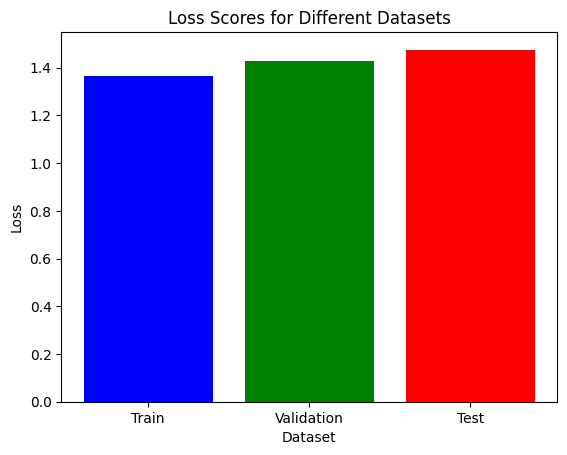

In [52]:
# Create a bar plot for lost scores
labels = ['Train', 'Validation', 'Test']
loss_scores = [train_score[0], valid_score[0], test_score[0]]

plt.bar(labels, loss_scores, color=['blue', 'green', 'red'])
plt.xlabel('Dataset')
plt.ylabel('Loss')
plt.title('Loss Scores for Different Datasets')
plt.show()

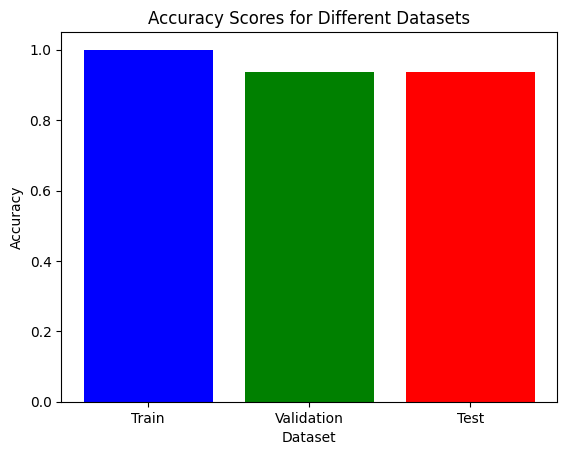

In [53]:
# Create a bar plot for accuracy scores
labels = ['Train', 'Validation', 'Test']
accuracy_scores = [train_score[1], valid_score[1], test_score[1]]

plt.bar(labels, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Dataset')
plt.ylabel('Accuracy')
plt.title('Accuracy Scores for Different Datasets')
plt.show()

Based on the Accuracy Score results above, we can see that:

**Train Loss** and **Train Accuracy**:

- Train Loss is the loss value measured during model training on training data. A low train loss value (1.367) indicates that the model can fit the training data well.
- Train Accuracy is the accuracy of the model on the training data. A high train accuracy value (1.0) indicates that the model can predict the training data perfectly, but it can also be a sign of overfitting if the accuracy value on validation or test data is lower.

**Validation Loss** and **Validation Accuracy**:

- Validation Loss is the loss value measured on validation data that was not used during training. The validation loss value (1.427) is quite close to the train loss, which indicates that the model is not overfitting.
- Validation Accuracy is the accuracy of the model on the validation data. A high validation accuracy value (0.9375) indicates that the model can make good predictions on data that has never been seen before, and the model seems to be quite general.

**Test Loss** and **Test Accuracy**:

- Test Loss is the loss value measured on test data that is never used during training or validation. The test loss value (1.475) is slightly higher than the validation loss, which is usually expected, but still within a reasonable range.
- Test Accuracy is the accuracy of the model on the test data. The test accuracy value (0.9375) indicates that the model also did well in generalizing on completely new data.


Overall, these results show that the models we train tend to perform well in predicting data, including on data that has never been seen before (test data).

## X. Model Saving

Finally, I chose the **ElasticNet** transfer learning model with the `ElasticNetB0` variation due to the much better Accuracy Score results compared to the previous model.

In [36]:
# Save Model
model_EN.save('model_fix.h5')

## XI. Model Inference

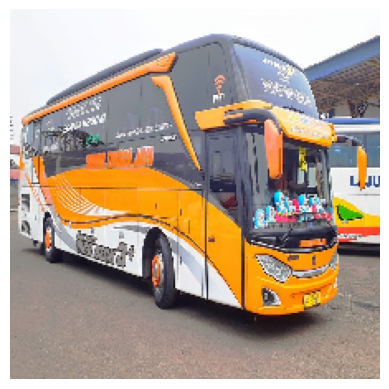

1/1 [==============================] - 0s 93ms/step
Result     :  [[0.9834062  0.00858613 0.00268456 0.00532316]]
Max Class  :  0
Class Name :  Bus



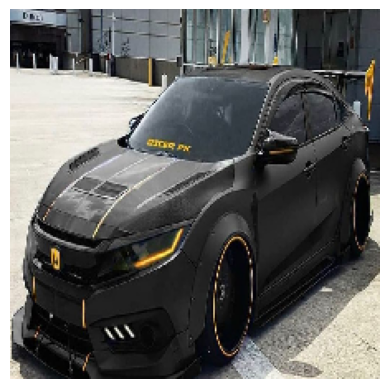

1/1 [==============================] - 0s 79ms/step
Result     :  [[0.01828191 0.8785634  0.06443013 0.0387245 ]]
Max Class  :  1
Class Name :  Car



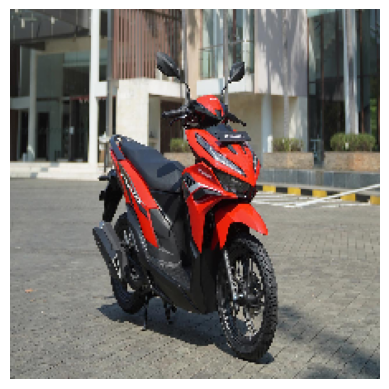

1/1 [==============================] - 0s 98ms/step
Result     :  [[3.8621179e-04 4.2973482e-03 1.3269950e-03 9.9398947e-01]]
Max Class  :  3
Class Name :  motorcycle



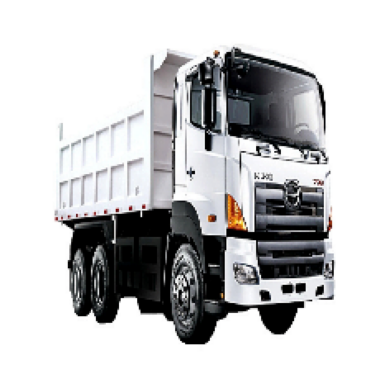

1/1 [==============================] - 0s 91ms/step
Result     :  [[3.3840172e-03 3.5416539e-04 9.9505252e-01 1.2093319e-03]]
Max Class  :  2
Class Name :  Truck



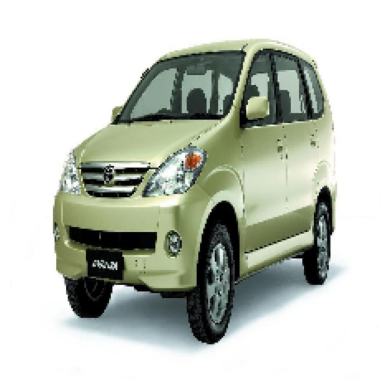

1/1 [==============================] - 0s 106ms/step
Result     :  [[0.07838    0.80187774 0.08071975 0.03902252]]
Max Class  :  1
Class Name :  Car



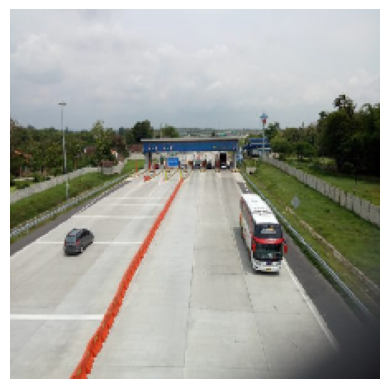

1/1 [==============================] - 0s 134ms/step
Result     :  [[0.02744173 0.50873464 0.42648757 0.03733611]]
Max Class  :  1
Class Name :  Car



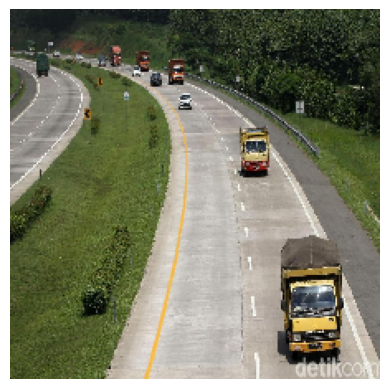

1/1 [==============================] - 0s 105ms/step
Result     :  [[9.9918455e-01 6.1239931e-04 1.4460558e-04 5.8436079e-05]]
Max Class  :  0
Class Name :  Bus



In [41]:
# Test Images

img_paths = ['/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/img/b.jpeg',
            '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/img/c.jpeg',
            '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/img/m.jpeg',
            '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/img/t.png',
            '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/img/avanza.jpeg',
            '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/img/tol.jpeg',
            '/Users/nugrahatheo/Desktop/p2-ftds021-rmt-ml2-theonugraha/img/tol2.jpeg']


for filename in img_paths:
    img = image.load_img(filename, target_size=(img_h, img_w))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_batch = np.expand_dims(img_array, axis=0)

    prediction = model_EN.predict(img_batch)
    result_max_proba = prediction.argmax(axis=-1)[0]
    class_names = ['Bus', 'Car', 'Truck', 'motorcycle']
    result_class = class_names[result_max_proba]

    print('Result     : ', prediction)
    print('Max Class  : ', result_max_proba)
    print('Class Name : ', result_class)
    print('')

## XII. Conclusion

Based on our test results above between the model we have built and the model with transfer learning, we can conclude that:

- In terms of accuracy, the model with transfer learning is much more accurate than the simple model we have built. This is proven by the Accuracy Score between the two models.

- Although the transfer learning model has good accuracy, it also has weaknesses. The model is good for recognizing vehicles with clear images or focus on 1 object image, but weak if the object image is small or out of focus. This is proven during the Inference Model.

- In both models, the training time is also long. This also needs to be considered when building real-time models.

- In business, the model with ElasticNet can help recognize the type of vehicle accurately on the condition that the image must be clear and expose the object. With these advantages, the model with ElasticNet is suitable for parking management, traffic analysis, market analysis and public facility security.

**Suggestions for Improvement**:

- Model Architecture Exploration: You can try exploring different model architectures, such as changing or adding layers to your model. You can also try better preprocessing models to extract better features from images.

- Hyperparameter Tuning: You can adjust the training hyperparameters, such as the learning rate or batch size. These adjustments can help speed up model convergence and improve performance.

- Data Augmentation: Adding data variations by augmentation (e.g. rotation, cropping, or shifting) can help the model learn a wide variety of images. This can help improve the accuracy of the model.

- Regularization: Applying regularization techniques such as dropout or weight decay can help reduce overfitting if needed.

- Further Data Collection: If possible, collecting more training data can help improve model performance. The more variety of data a model has, the better it is at generalizing knowledge.

- Testing with New Data: Once you have updated your model, make sure to test the model with data that it has never seen before (test data) to get a better estimate of its performance in the real world.

- Hardware Optimization: If you have access to more powerful hardware (for example, a faster GPU), this can help speed up training.